### Proyecto Integrador Maestría en Ciencia de Datos

Proyecto #4 de la materia Ingeniería de Caracteristicas impartida por el Dr. Julio Waissman en la Maestría en Ciencia de Datos.

Elaborado por:


*   Carlos Alejandro Velázquez Valdez



### Descripción del problema

La disposición inadecuada de residuos sólidos es uno de los mayores problemas que enfrentan las ciudades. En años recientes se ha disparado la aparición de tiraderos clandestinos en muchas áreas de la Ciudad de México(CDMX), representando un reto técnico, presupuestario y legal para los gobiernos. Es importante encontrar maneras para prevenir que se formen más tiraderos clandestinos. Previamente se han usado diferentes maneras para combatir la formación de estos, por ejemplo en Xochimilco se [implementó un programa de vigilancia](https://www.excelsior.com.mx/comunidad/xochimilco-va-contra-tiraderos-clandestinos/1273959). Por otro lado, en Tlalnepantla se han [transformado tiraderos clandestinos en areas verdes.](https://continuamos.mx/?p=1861)

El Centro de Comando, Control, Cómputo, Comunicaciones y Contacto Ciudadano de la Ciudad de México “C5”, tiene instalados más de 13 mil postes los cuales incluyen más de 15 mil cámaras de vigilancia que hay en la Ciudad de México (Sistema Tecnológico de Videovigilancia STVs), con la finalidad de prevenir y alertar inmediatamente a las autoridades de seguridad y de emergencias capitalinas sobre cualquier situación de riesgo. Uno de los objetivos de este proyecto es ver si el número de postes C5 implementados(postes de vigilancia) están relacionados con los tiraderos clandestinos reportados.

Por otra parte, ha sido reportado previamente que la CDMX [carece de espacios verdes suficientes](https://www.forbes.com.mx/cdmx-carece-de-espacios-verdes-suficientes-greenpeace/), por lo que otro objetivo de este proyecto será analizar los datos de areas verdes existentes en CDMX y analisar si tienen relación con los tiraderos clandestinos existentes.

En este proyecto se utilizarán Datasets obtenidos del [Portal de Datos Abiertos de la CDMX](https://datos.cdmx.gob.mx/).

### Obtención de información



Los datos utilizados en este proyecto fueron extraidos de las siguientes bases de datos:    

*   Wifi gratuito en postes C5: https://datos.cdmx.gob.mx/dataset/ubicacion-acceso-gratuito-internet-wifi-c5
*   Wifi gratuito en Sitios Publicos: https://datos.cdmx.gob.mx/dataset/sitios-publicos-wifi
*   Wifi gratuito en Postes MiBarrio: https://datos.cdmx.gob.mx/dataset/wifi-de-barrio
*   Wifi gratuito en PILARES Disponible en: https://datos.cdmx.gob.mx/dataset/wifi-gratuito-en-pilares 
*   Areas Verdes de la Ciudad de Mexico (2021) Disponible en: https://datos.cdmx.gob.mx/dataset/cdmx_areas_verdes_2017
*   Tiraderos clandestinos de la Ciudad de Mexico (2017) Disponible en: https://datos.cdmx.gob.mx/dataset/tiraderos-clandestinos-al-cierre-de-2017
*   Alcaldía (Shapefiles) (2021) Disponible en: https://datos.cdmx.gob.mx/dataset/alcaldias/resource/8648431b-4f34-4f1a-a4b1-19142f944300?inner_span=True


In [341]:
#Imports necesarios para todo el notebook
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas
import contextily as cx
import missingno as msno


In [342]:
#Importando datos de Wifi en Sitios Publicos
internet_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/f14bbd14-9872-4b50-8c21-1efebb8108da/resource/1c9aa7ab-49f6-4fbb-ab8f-9e2837c3010f/download/wifi_gratuito_en_sitios_publicos.csv', encoding='ISO-8859-1')
internet_data.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,Viveros De Coyoacán,DEL CARMEN,COYOACÁN,19.35370,-99.17177,1,Sitios_Publicos
1,Villa,VILLA GUSTAVO A MADERO,GUSTAVO A. MADERO,19.48710,-99.11429,1,Sitios_Publicos
2,Toxicológico Xochimilco,TIERRA NUEVA,XOCHIMILCO,19.26485,-99.11495,1,Sitios_Publicos
3,Toxicológico Venustiano Carranza,CUCHILLA PANTITLAN 2156,VENUSTIANO CARRANZA,19.42128,-99.06899,1,Sitios_Publicos
4,Ticomán,LA PURISIMA TICOMAN,GUSTAVO A. MADERO,19.50900,-99.13260,4,Sitios_Publicos


In [343]:
#Importando Datos de Wifi en Postes Mi Barrio
mibarrio_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/bbbd201b-28fc-4a2b-978b-1968829c1d54/resource/7bb21e65-d6d1-44c3-8db0-ee91012ac2d9/download/wifi_gratuito_en_postes_mi_barrio.csv', encoding='ISO-8859-1')
mibarrio_data.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,MC11349,LOMAS DE CUILOTEPEC 2272,TLALPAN,19.271800,-99.233433,1,Mi_Barrio
1,MC3909,CENTRO,CUAUHTÉMOC,19.433272,-99.142814,1,Mi_Barrio
2,MC12425,TLALCOLIGIA,TLALPAN,19.277268,-99.172666,1,Mi_Barrio
3,MC11517,MIGUEL HIDALGO 2DA SECCION,TLALPAN,19.278665,-99.196977,1,Mi_Barrio
4,MC11791,SANTA URSULA XITLA,TLALPAN,19.272633,-99.180923,1,Mi_Barrio


In [344]:
#Importando Datos de WIfi en Postes C5
c5_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/909a033e-9a2c-41c7-a10e-ab1bd92a8095/resource/7cc6ff61-6178-4ba6-b39f-1f9eb3def57b/download/wifi_gratuito_en_postes_c5.csv',encoding='ISO-8859-1') 
c5_data.shape

(13714, 7)

In [345]:
#Importando Datos de Wifi en Programa PILARES
pilares_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/1ffc6aa1-7018-4f52-9d5d-ec1be27effce/resource/195d7999-5954-49ae-bdc3-3895dba766b9/download/wifi_gratuito_en_pilares.csv', encoding='ISO-8859-1' )
pilares_data.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,LOMAS DE LA ESTANCIA,SANTIAGO ACAHUALTEPEC 2DA AMPLIACION 2530,IZTAPALAPA,19.340495,-99.007658,3,PILARES
1,MOCTEZUMA,MOCTEZUMA 2DA SECCION,VENUSTIANO CARRANZA,19.428014,-99.101105,5,PILARES
2,SAN JUAN DE ARAGÓN,SAN JUAN DE ARAGON I SECCION 2437,GUSTAVO A. MADERO,19.457270,-99.083040,5,PILARES
3,SAN MIGUEL TEOTONGO,SAN MIGUEL TEOTONGO,IZTAPALAPA,19.340483,-98.992478,3,PILARES
4,CIBERESCUELA CUAJIMALPA,CUAJIMALPA,CUAJIMALPA DE MORELOS,19.358134,-99.301223,1,PILARES


In [346]:
#Concatenando todos los Datos de Wifi
internet_cdmx = pd.concat([pilares_data, c5_data, internet_data, mibarrio_data])
internet_cdmx.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,LOMAS DE LA ESTANCIA,SANTIAGO ACAHUALTEPEC 2DA AMPLIACION 2530,IZTAPALAPA,19.340495,-99.007658,3,PILARES
1,MOCTEZUMA,MOCTEZUMA 2DA SECCION,VENUSTIANO CARRANZA,19.428014,-99.101105,5,PILARES
2,SAN JUAN DE ARAGÓN,SAN JUAN DE ARAGON I SECCION 2437,GUSTAVO A. MADERO,19.457270,-99.083040,5,PILARES
3,SAN MIGUEL TEOTONGO,SAN MIGUEL TEOTONGO,IZTAPALAPA,19.340483,-98.992478,3,PILARES
4,CIBERESCUELA CUAJIMALPA,CUAJIMALPA,CUAJIMALPA DE MORELOS,19.358134,-99.301223,1,PILARES


In [348]:
#Importando Datos de Sitios Verdes en CDMX
verde_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/6e9d5e75-9cf1-4ebf-b592-69ac7a89414e/resource/dec7a37a-0a32-4713-a50f-6ea646df5ab4/download/cdmx_areas_verdes_2017.csv')
verde_data.head()

,id,geo_point_2d,geo_shape,muerdago,p_sp_her_d,zonifica,subcat_sed,subcve_sed,p_manejo,tipo,p_sp_abs_d,f_decreto,direccion,gid,cve_delg,p_arbustiv,ubicacion,nombre,delegacion,p_sp_arb_d,p_herbaceo,p_sp_do_mu,p_arboreo,categoria,superficie,e_urbano,perimetro,cve_sedema,responsabl
0,0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Panteones,604.0,NaN,NaN,NaN,NaN,Román Álvarez Moreno,268,2,NaN,NaN,NaN,Azcapotzalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,6660.027554,NaN,329.264738,600,NaN
1,1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Deportivos,601.0,NaN,NaN,NaN,NaN,Avenida Canal deTezontle,87,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,2917.257837,NaN,272.243614,600,NaN
2,2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Camellones centrales y laterales,203.0,NaN,NaN,NaN,NaN,Canal Río Churubusco,180,8,NaN,NaN,CAMELLON EJE 4 OTE. (RIO CHURUBUSCO),Iztacalco,NaN,NaN,NaN,NaN,Áreas verdes complementarias o ligadas a la re...,1086.305646,NaN,425.043656,200,NaN
3,3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,CORTEZA,89,8,NaN,AV. GIRASOL ENTRE MAGUEY Y CUMBRE.,"PARQUE GIRASOL ""CENTRAL INFONAVIT"".",Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,3605.704046,NaN,269.209436,600,NaN
4,4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,El Lago,90,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,19619.361577,NaN,798.409227,600,NaN


In [349]:
#Importando datos de tiraderos clandestinos de la CDMX
tiradero_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/c5a40bb7-241c-4bb0-8a59-6218526ba01c/resource/7041d302-e17b-4137-94a7-383b6b713761/download/tiraderos-clandestinos-al-cierre-de-2017.csv')
tiradero_data.head()

,id,column_1,fid,id_sedema,no_alcaldi,alcaldia,direccion,tipo_tirad,calle,no_ext,no_int,colonia,entre_que,longitud,latitud,geo_point
0,0,6,6,567,14,Benito Juarez,NaN,NaN,"Municipio Libre Es2Quina Miraflores, Colonia P...",NaN,NaN,PORTALES ORIENTE,NaN,-99.139980,19.367720,"19.36772,-99.13998"
1,1,41,41,402,9,Milpa Alta,NaN,NaN,Av. Hifalgo Y 2Ç÷ Cjon De Independencia,NaN,NaN,SAN PEDRO ATOCPAN,NaN,-99.042876,19.203210,"19.2032099,-99.0428762"
2,2,78,78,508,11,Tlahuac,NaN,NaN,Angƒ??lica Paulet,NaN,NaN,LA NOPALERA,NaN,-99.055393,19.296997,"19.296997,-99.055393"
3,3,81,81,62,3,Coyoacan,NaN,NaN,Bodega De Barrido Manual Santa Cecilia,NaN,NaN,CTM SECCIÇÿN 10,NaN,-99.107160,19.300200,"19.3002,-99.1071599"
4,4,83,83,498,11,Tlahuac,NaN,NaN,Av. Tl¶ÿ¶Huac,NaN,NaN,LA NOPALERA,NaN,-99.054197,19.302147,"19.302147,-99.054197"


### Limpieza y armonizando de variables

#### Limpiando datos de Puntos de Servicio de Wifi Gratuito

In [350]:
internet_cdmx.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,LOMAS DE LA ESTANCIA,SANTIAGO ACAHUALTEPEC 2DA AMPLIACION 2530,IZTAPALAPA,19.340495,-99.007658,3,PILARES
1,MOCTEZUMA,MOCTEZUMA 2DA SECCION,VENUSTIANO CARRANZA,19.428014,-99.101105,5,PILARES
2,SAN JUAN DE ARAGÓN,SAN JUAN DE ARAGON I SECCION 2437,GUSTAVO A. MADERO,19.457270,-99.083040,5,PILARES
3,SAN MIGUEL TEOTONGO,SAN MIGUEL TEOTONGO,IZTAPALAPA,19.340483,-98.992478,3,PILARES
4,CIBERESCUELA CUAJIMALPA,CUAJIMALPA,CUAJIMALPA DE MORELOS,19.358134,-99.301223,1,PILARES


In [351]:
internet_cdmx.dtypes

ID                   object
Colonia              object
Alcaldía             object
Latitud             float64
Longitud            float64
Puntos_de_acceso      int64
Programa             object
dtype: object

Observamos que la columna Alcaldía y Programa están como object cuando en realidad es una variable categórica, por lo que la cambiaremos.

In [352]:
internet_cdmx['Alcaldía'] = internet_cdmx['Alcaldía'].astype('category')
internet_cdmx['Programa'] = internet_cdmx['Programa'].astype('category')

In [353]:
#Confirmamos que se haya cambiado el tipo de datos
internet_cdmx.dtypes

ID                    object
Colonia               object
Alcaldía            category
Latitud              float64
Longitud             float64
Puntos_de_acceso       int64
Programa            category
dtype: object

Como se puede ver en la siguiente gráfica, no hay valores perdidos, lo cual presenta una ventaja a la hora de su análisis.

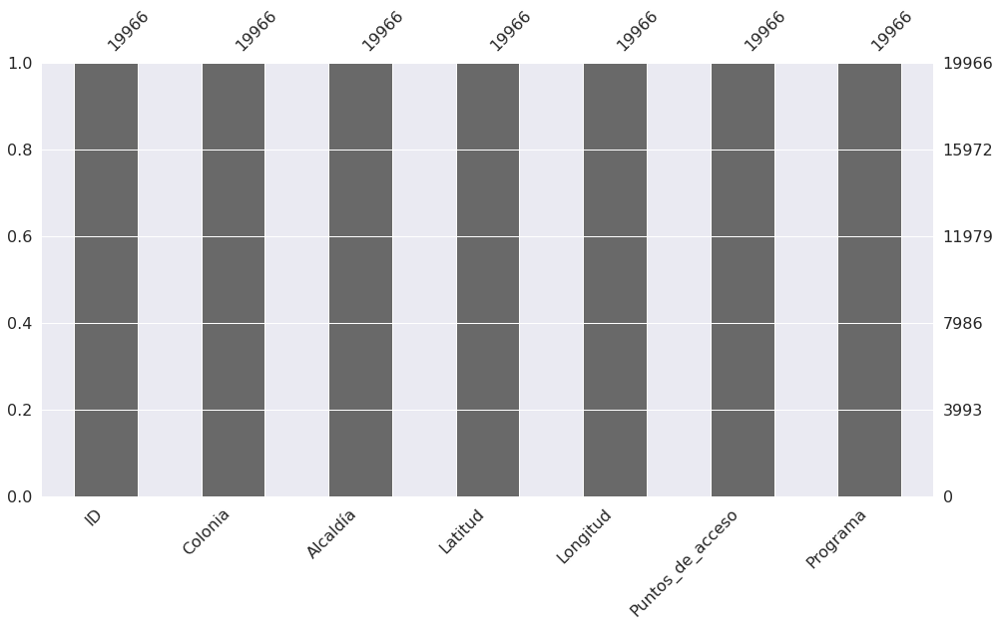

In [354]:
msno.bar(internet_cdmx, figsize=(16,8))

Por ultimo revisamos para ver si hay datos duplicados

In [415]:
duplicate_rows_df = internet_cdmx[internet_cdmx.duplicated()]
duplicate_rows_df.shape
print(f'Numero de registros duplicados: {duplicate_rows_df.shape[0]}')

Numero de registros duplicados: 0


#### Limpiando datos de tiraderos clandestinos

In [355]:
tiradero_data.head()

,id,column_1,fid,id_sedema,no_alcaldi,alcaldia,direccion,tipo_tirad,calle,no_ext,no_int,colonia,entre_que,longitud,latitud,geo_point
0,0,6,6,567,14,Benito Juarez,NaN,NaN,"Municipio Libre Es2Quina Miraflores, Colonia P...",NaN,NaN,PORTALES ORIENTE,NaN,-99.139980,19.367720,"19.36772,-99.13998"
1,1,41,41,402,9,Milpa Alta,NaN,NaN,Av. Hifalgo Y 2Ç÷ Cjon De Independencia,NaN,NaN,SAN PEDRO ATOCPAN,NaN,-99.042876,19.203210,"19.2032099,-99.0428762"
2,2,78,78,508,11,Tlahuac,NaN,NaN,Angƒ??lica Paulet,NaN,NaN,LA NOPALERA,NaN,-99.055393,19.296997,"19.296997,-99.055393"
3,3,81,81,62,3,Coyoacan,NaN,NaN,Bodega De Barrido Manual Santa Cecilia,NaN,NaN,CTM SECCIÇÿN 10,NaN,-99.107160,19.300200,"19.3002,-99.1071599"
4,4,83,83,498,11,Tlahuac,NaN,NaN,Av. Tl¶ÿ¶Huac,NaN,NaN,LA NOPALERA,NaN,-99.054197,19.302147,"19.302147,-99.054197"


Antes de cambiar el tipo de dato de las columnas, con el método .head() a simple vista vemos que hay columnas que apuntan a tener muchos valores perdidos, por lo que primero confirmaremos el número de valores perdidos.

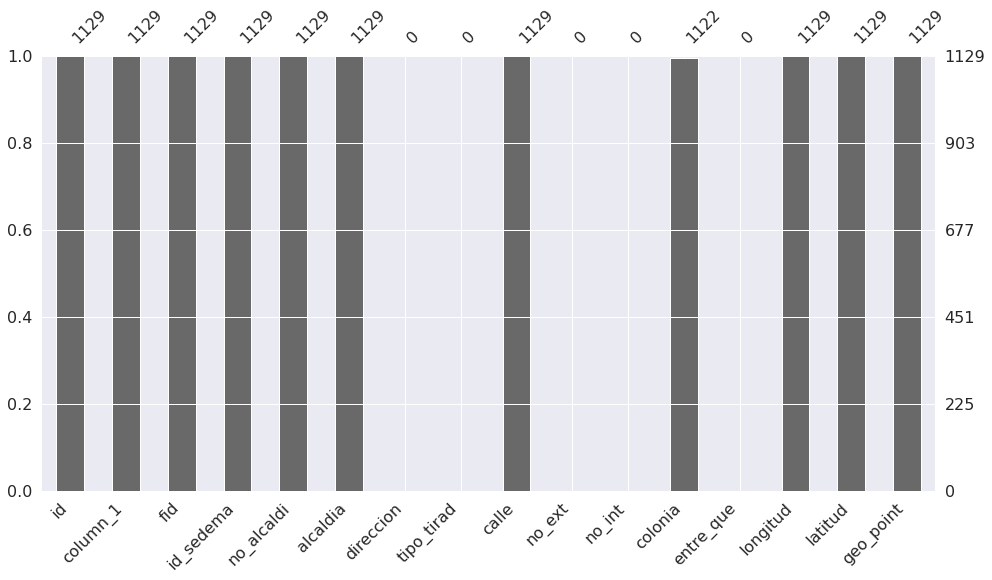

In [356]:
msno.bar(tiradero_data, figsize=(16,8))

Efectivamente, vemos que hay columnas que tienen puros datos perdidos, por lo que las eliminaremos.

In [357]:
tiradero_data.drop(['direccion','tipo_tirad', 'no_ext', 'no_int', 'entre_que'], axis=1, inplace=True)
tiradero_data.head()

,id,column_1,fid,id_sedema,no_alcaldi,alcaldia,calle,colonia,longitud,latitud,geo_point
0,0,6,6,567,14,Benito Juarez,"Municipio Libre Es2Quina Miraflores, Colonia P...",PORTALES ORIENTE,-99.139980,19.367720,"19.36772,-99.13998"
1,1,41,41,402,9,Milpa Alta,Av. Hifalgo Y 2Ç÷ Cjon De Independencia,SAN PEDRO ATOCPAN,-99.042876,19.203210,"19.2032099,-99.0428762"
2,2,78,78,508,11,Tlahuac,Angƒ??lica Paulet,LA NOPALERA,-99.055393,19.296997,"19.296997,-99.055393"
3,3,81,81,62,3,Coyoacan,Bodega De Barrido Manual Santa Cecilia,CTM SECCIÇÿN 10,-99.107160,19.300200,"19.3002,-99.1071599"
4,4,83,83,498,11,Tlahuac,Av. Tl¶ÿ¶Huac,LA NOPALERA,-99.054197,19.302147,"19.302147,-99.054197"


Una vez que ya no tenemos valores perdidos, ahora podemos verificar si el tipo de datos de las columnas es el correcto

In [358]:
tiradero_data.dtypes

id              int64
column_1        int64
fid             int64
id_sedema       int64
no_alcaldi      int64
alcaldia       object
calle          object
colonia        object
longitud      float64
latitud       float64
geo_point      object
dtype: object

Como en el Dataset anterior, cambiaremos la columna alcaldia por un tipo de dato categórico y confirmamos que cambió

In [359]:
tiradero_data['alcaldia'] = tiradero_data['alcaldia'].astype('category')
tiradero_data.dtypes

id               int64
column_1         int64
fid              int64
id_sedema        int64
no_alcaldi       int64
alcaldia      category
calle           object
colonia         object
longitud       float64
latitud        float64
geo_point       object
dtype: object

In [416]:
duplicate_rows_df = tiradero_data[tiradero_data.duplicated()]
duplicate_rows_df.shape
print(f'Numero de registros duplicados: {duplicate_rows_df.shape[0]}')

Numero de registros duplicados: 0


#### Limpiando datos de Areas verdes

In [360]:
verde_data.head()

,id,geo_point_2d,geo_shape,muerdago,p_sp_her_d,zonifica,subcat_sed,subcve_sed,p_manejo,tipo,p_sp_abs_d,f_decreto,direccion,gid,cve_delg,p_arbustiv,ubicacion,nombre,delegacion,p_sp_arb_d,p_herbaceo,p_sp_do_mu,p_arboreo,categoria,superficie,e_urbano,perimetro,cve_sedema,responsabl
0,0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Panteones,604.0,NaN,NaN,NaN,NaN,Román Álvarez Moreno,268,2,NaN,NaN,NaN,Azcapotzalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,6660.027554,NaN,329.264738,600,NaN
1,1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Deportivos,601.0,NaN,NaN,NaN,NaN,Avenida Canal deTezontle,87,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,2917.257837,NaN,272.243614,600,NaN
2,2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Camellones centrales y laterales,203.0,NaN,NaN,NaN,NaN,Canal Río Churubusco,180,8,NaN,NaN,CAMELLON EJE 4 OTE. (RIO CHURUBUSCO),Iztacalco,NaN,NaN,NaN,NaN,Áreas verdes complementarias o ligadas a la re...,1086.305646,NaN,425.043656,200,NaN
3,3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,CORTEZA,89,8,NaN,AV. GIRASOL ENTRE MAGUEY Y CUMBRE.,"PARQUE GIRASOL ""CENTRAL INFONAVIT"".",Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,3605.704046,NaN,269.209436,600,NaN
4,4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,El Lago,90,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,19619.361577,NaN,798.409227,600,NaN


Al igual que en el caso pasado, a simple vista observamos muchos NaN, por lo que antes de cambiar el tipo de dato de las columnas primero observaremos los datos perdidos

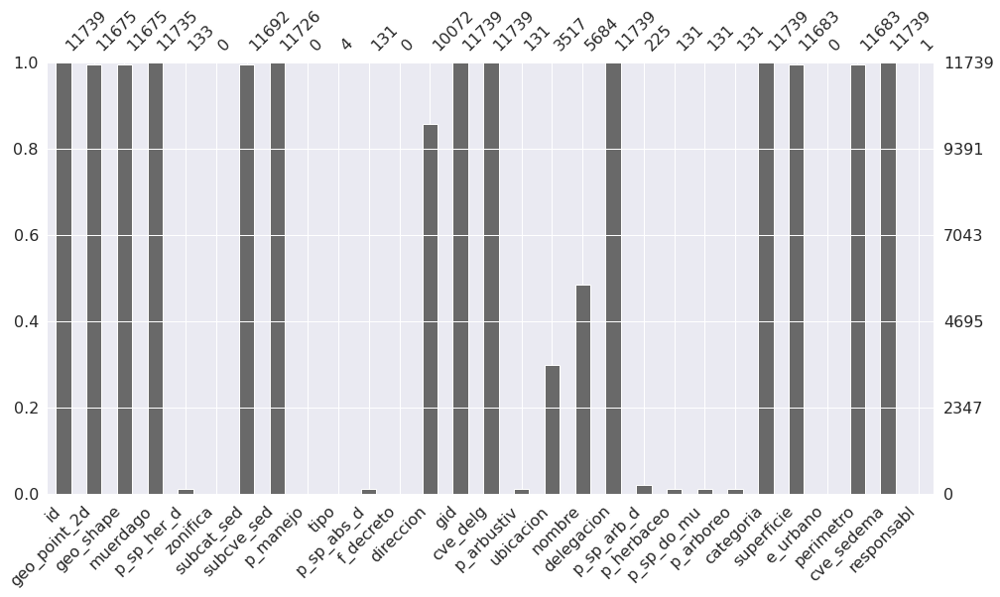

In [361]:
msno.bar(verde_data, figsize=(16,8))

Observamos que hay una gran cantidad de columnas vacías o con muy pocos datos, por lo que tambien las reomveremos.

In [362]:
columnas_a_remover = ['p_sp_her_d','zonifica', 'p_manejo', 'tipo', 'p_sp_abs_d', 'f_decreto','p_arbustiv','ubicacion',
                      'p_sp_arb_d', 'p_herbaceo', 'p_sp_do_mu', 'p_arboreo','e_urbano','responsabl', 'nombre']
verde_data.drop(columnas_a_remover, axis=1, inplace=True)
verde_data.head()

,id,geo_point_2d,geo_shape,muerdago,subcat_sed,subcve_sed,direccion,gid,cve_delg,delegacion,categoria,superficie,perimetro,cve_sedema
0,0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Panteones,604.0,Román Álvarez Moreno,268,2,Azcapotzalco,Equipamientos urbanos con vegetación,6660.027554,329.264738,600
1,1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Deportivos,601.0,Avenida Canal deTezontle,87,8,Iztacalco,Equipamientos urbanos con vegetación,2917.257837,272.243614,600
2,2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Camellones centrales y laterales,203.0,Canal Río Churubusco,180,8,Iztacalco,Áreas verdes complementarias o ligadas a la re...,1086.305646,425.043656,200
3,3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,CORTEZA,89,8,Iztacalco,Equipamientos urbanos con vegetación,3605.704046,269.209436,600
4,4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,El Lago,90,8,Iztacalco,Equipamientos urbanos con vegetación,19619.361577,798.409227,600


Una vez que ya nos hayamos encargado de los datos faltantes, ahora cambiaremos las columnas categoria, delegacion, subcat_sed a tipo de dato categórico

In [363]:
verde_data['categoria'] = verde_data['categoria'].astype('category')
verde_data['delegacion'] = verde_data['delegacion'].astype('category')
verde_data['subcat_sed'] = verde_data['subcat_sed'].astype('category')
verde_data.dtypes

id                 int64
geo_point_2d      object
geo_shape         object
muerdago          object
subcat_sed      category
subcve_sed       float64
direccion         object
gid                int64
cve_delg           int64
delegacion      category
categoria       category
superficie       float64
perimetro        float64
cve_sedema         int64
dtype: object

In [417]:
duplicate_rows_df = verde_data[verde_data.duplicated()]
duplicate_rows_df.shape
print(f'Numero de registros duplicados: {duplicate_rows_df.shape[0]}')

Numero de registros duplicados: 0


Ahora, para poder graficar, debido a que no tenemos un shapefile, realizaremos unas transformaciones al csv para poder representarlo en el mapa

In [364]:
#Creamos dos columnas apartir de geo_point_2d
verde_data[['latitud','longitud']] = verde_data['geo_point_2d'].str.split(',',1, expand=True)

In [365]:
verde_data = verde_data.dropna(axis=0, how='any', thresh=None, subset=['latitud'], inplace=False)

In [366]:
verde_data['latitud'] = verde_data['latitud'].astype(float)
verde_data['longitud'] = verde_data['longitud'].astype(float)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### Generación de conjunto de datos arreglado

Generaremos dos conjuntos de datos, el primero será uno que muestre la suma de todos los tiraderos, areas verdes y postes del c5 que hay en cada alcaldía, además le agregaremos la población y el area de cada alcaldía.

El otro conjunto de dato será aglomerar todos los registros de area verde, postes del c5 y tiraderos clandestinos, con su respectiva latitud y longitud, con el fin de facilitar su visualización.

#### Generación del primer Dataset

In [367]:
data1 = tiradero_data['alcaldia'].value_counts()
df = data1.to_frame().reset_index(level=0)
df.rename(columns={'index': 'alcaldia', 'alcaldia': 'tiraderos'}, inplace=True)
df

,alcaldia,tiraderos
0,Cuauhtemoc,274
1,Iztapalapa,219
2,Benito Juarez,147
3,Venustiano Carranza,109
4,Alvaro Obregon,77
5,Miguel Hidalgo,69
6,Coyoacan,68
7,Iztacalco,47
8,Azcapotzalco,47
9,Tlahuac,35


In [368]:
data2 = verde_data['delegacion'].value_counts()
df2 = data2.to_frame().reset_index(level=0)
df2.rename(columns={'index': 'alcaldia', 'delegacion': 'areas_verdes'}, inplace=True)

mapper = {"Iztapalapa": "Iztapalapa",
          "Coyoacán": "Coyoacan",
          "Azcapotzalco": "Azcapotzalco",
          "Miguel Hidalgo": "Miguel Hidalgo",
          "Tlalpan":"Tlalpan",
          "Álvaro Obregón": "Alvaro Obregon",
          "Venustiano Carranza":"Venustiano Carranza",
          "Tláhuac":"Tlahuac",
          "Cuauhtémoc":"Cuauhtemoc",
          "Benito Juárez":"Benito Juarez",
          "Cuajimalpa de Morelos":"Cuajimalpa",
          "Iztacalco":"Iztacalco",
          "Magdalena Contreras": "Magdalena Contreras",
          "Xochimilco":"Xochimilco",
          "Milpa Alta":"Milpa Alta"}

df2.replace({"alcaldia": mapper}, inplace=True)
df2

,alcaldia,areas_verdes
0,Iztapalapa,2098
1,Coyoacan,1802
2,Azcapotzalco,948
3,Miguel Hidalgo,925
4,Gustavo A. Madero,835
5,Tlalpan,735
6,Alvaro Obregon,721
7,Venustiano Carranza,630
8,Tlahuac,576
9,Cuauhtemoc,566


In [369]:
data3 = internet_cdmx['Alcaldía'].value_counts()
df3 = data3.to_frame().reset_index(level=0)
df3.rename(columns={'index': 'alcaldia', 'Alcaldía': 'puntos_wifi'}, inplace=True)
mapper = {"IZTAPALAPA": "Iztapalapa",
          "COYOACÁN": "Coyoacan",
          "AZCAPOTZALCO": "Azcapotzalco",
          "MIGUEL HIDALGO": "Miguel Hidalgo",
          "TLALPAN":"Tlalpan",
          "ÁLVARO OBREGÓN": "Alvaro Obregon",
          "VENUSTIANO CARRANZA":"Venustiano Carranza",
          "TLÁHUAC":"Tlahuac",
          "CUAUHTÉMOC":"Cuauhtemoc",
          "BENITO JUÁREZ":"Benito Juarez",
          "CUAJIMALPA DE MORELOS":"Cuajimalpa",
          "IZTACALCO":"Iztacalco",
          "LA MAGDALENA CONTRERAS": "Magdalena Contreras",
          "XOCHIMILCO":"Xochimilco",
          "MILPA ALTA":"Milpa Alta",
          "GUSTAVO A. MADERO": "Gustavo A. Madero"}

df3.replace({"alcaldia": mapper}, inplace=True)
df3

,alcaldia,puntos_wifi
0,Iztapalapa,2160
1,Tlalpan,2053
2,Cuauhtemoc,1967
3,Gustavo A. Madero,1836
4,Alvaro Obregon,1786
5,Coyoacan,1711
6,Miguel Hidalgo,1476
7,Azcapotzalco,1355
8,Benito Juarez,1350
9,Venustiano Carranza,1011


In [370]:
df_temp = pd.merge(df,df2,on='alcaldia',how='outer')
df_completo = pd.merge(df_temp,df3,on='alcaldia',how='outer')
df_completo

,alcaldia,tiraderos,areas_verdes,puntos_wifi
0,Cuauhtemoc,274.0,566,1967
1,Iztapalapa,219.0,2098,2160
2,Benito Juarez,147.0,484,1350
3,Venustiano Carranza,109.0,630,1011
4,Alvaro Obregon,77.0,721,1786
5,Miguel Hidalgo,69.0,925,1476
6,Coyoacan,68.0,1802,1711
7,Iztacalco,47.0,386,850
8,Azcapotzalco,47.0,948,1355
9,Tlahuac,35.0,576,564


Por ultimo, agregamos la población y la superficie (en km^2) para cada delegación

In [371]:
poblacion = pd.Series([545884, 1835486, 434153, 443704, 759137, 414470, 614447, 432205, 404695, 392313, 152685, 442178, 217686, 247622, 699928, 1173351])
superficie = pd.Series([32.40, 117.00, 26.63, 33.40, 96.17, 46.99,  54.40, 33.66, 23.30, 85.34, 228.41, 122.00, 74.58, 74.58, 312, 94.07])

Los agregamos como columnas al Dataframe

In [372]:
df_completo['poblacion'] = poblacion
df_completo['superficie'] = superficie

In [373]:
df_completo

,alcaldia,tiraderos,areas_verdes,puntos_wifi,poblacion,superficie
0,Cuauhtemoc,274.0,566,1967,545884,32.40
1,Iztapalapa,219.0,2098,2160,1835486,117.00
2,Benito Juarez,147.0,484,1350,434153,26.63
3,Venustiano Carranza,109.0,630,1011,443704,33.40
4,Alvaro Obregon,77.0,721,1786,759137,96.17
5,Miguel Hidalgo,69.0,925,1476,414470,46.99
6,Coyoacan,68.0,1802,1711,614447,54.40
7,Iztacalco,47.0,386,850,432205,33.66
8,Azcapotzalco,47.0,948,1355,404695,23.30
9,Tlahuac,35.0,576,564,392313,85.34


In [414]:
df_completo.to_csv('datos_alcaldias.csv')

#### Generación del segundo Dataset

Aqui juntaremos todos los registros individuales de areas verdes, postes c5, y tiraderos clandestinos con sus coordenadas con el fin de facilitar su visulaización

In [374]:
visualizacion_data_tiradero = pd.DataFrame()
visualizacion_data_tiradero['longitud'] = tiradero_data['longitud']
visualizacion_data_tiradero['latitud'] = tiradero_data['latitud']
visualizacion_data_tiradero['tipo'] = 'tiradero'

visualizacion_data_verde = pd.DataFrame()
visualizacion_data_verde['longitud'] = verde_data['longitud']
visualizacion_data_verde['latitud'] = verde_data['latitud']
visualizacion_data_verde['tipo'] = 'area verde'

visualizacion_data_c5 = pd.DataFrame()
visualizacion_data_c5['longitud'] = c5_data['Longitud']
visualizacion_data_c5['latitud'] = c5_data['Latitud']
visualizacion_data_c5['tipo'] = 'poste c5'

In [375]:
datos_visualizacion = pd.concat([visualizacion_data_tiradero, visualizacion_data_verde, visualizacion_data_c5])

In [376]:
datos_visualizacion.reset_index(drop=True, inplace=True)

In [377]:
datos_visualizacion

,longitud,latitud,tipo
0,-99.139980,19.367720,tiradero
1,-99.042876,19.203210,tiradero
2,-99.055393,19.296997,tiradero
3,-99.107160,19.300200,tiradero
4,-99.054197,19.302147,tiradero
...,...,...,...
26513,-99.099560,19.442320,poste c5
26514,-99.096330,19.447540,poste c5
26515,-99.085930,19.412320,poste c5
26516,-99.087090,19.409450,poste c5


In [413]:
#Transformando a parquet
datos_visualizacion.to_csv('datos_visualizacion.csv')

### Analisis de Datos Exploratorio(EDA)

In [378]:
datasets = {"Internet Espacio Publico": internet_data,
            "Internet Mi-Barrio": mibarrio_data,
            "Internet Postes C5":c5_data,
            "Internet Pilares": pilares_data,
            "Areas Verdes": verde_data,
            "Tiraderos clandestinos": tiradero_data}
for k,v in datasets.items():
  print("-" * 25)
  print(f"Dimensiones del Dataset {k}:")
  print(f"Registros: {v.shape[0]}")
  print(f"Columnas: {v.shape[1]}")
  print("-" * 25)

-------------------------
Dimensiones del Dataset Internet Espacio Publico:
Registros: 100
Columnas: 7
-------------------------
-------------------------
Dimensiones del Dataset Internet Mi-Barrio:
Registros: 5935
Columnas: 7
-------------------------
-------------------------
Dimensiones del Dataset Internet Postes C5:
Registros: 13714
Columnas: 7
-------------------------
-------------------------
Dimensiones del Dataset Internet Pilares:
Registros: 217
Columnas: 7
-------------------------
-------------------------
Dimensiones del Dataset Areas Verdes:
Registros: 11675
Columnas: 16
-------------------------
-------------------------
Dimensiones del Dataset Tiraderos clandestinos:
Registros: 1129
Columnas: 11
-------------------------


#### EDA de Dataset de puntos de servicio de Wifi gratuito en la CDMX

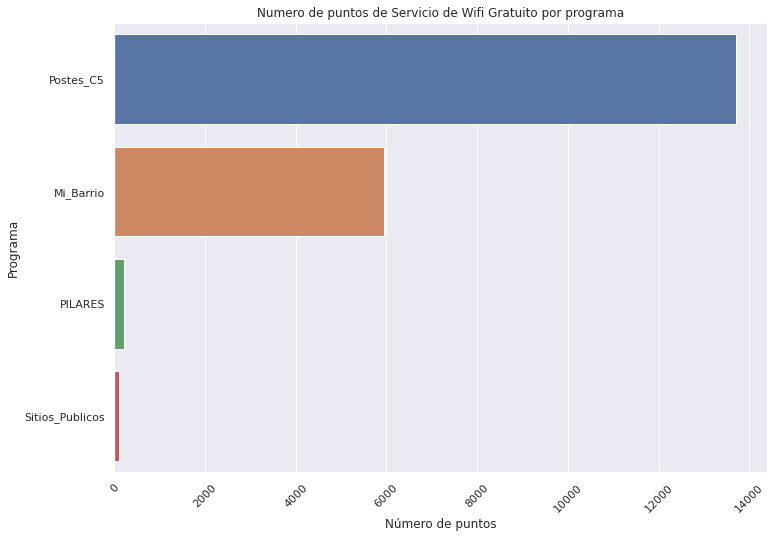

In [379]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = internet_cdmx, y = 'Programa', orient='h', order = ['Postes_C5', 'Mi_Barrio', "PILARES", "Sitios_Publicos"])
plt.title('Numero de puntos de Servicio de Wifi Gratuito por programa')
plt.xticks(rotation = 45)
plt.xlabel('Número de puntos')
plt.show()

Como se puede observar el programa de servicio de Wifi gratuito de postes C5 es el que mas presenta puntos de servicio, seguido por el programa MiBarrio y por ultimo PILARES y Wifi en sitios públicos.

Posteriormente compararemos el numero de puntos de servicio de Wifi Gratuito por alcaldía.

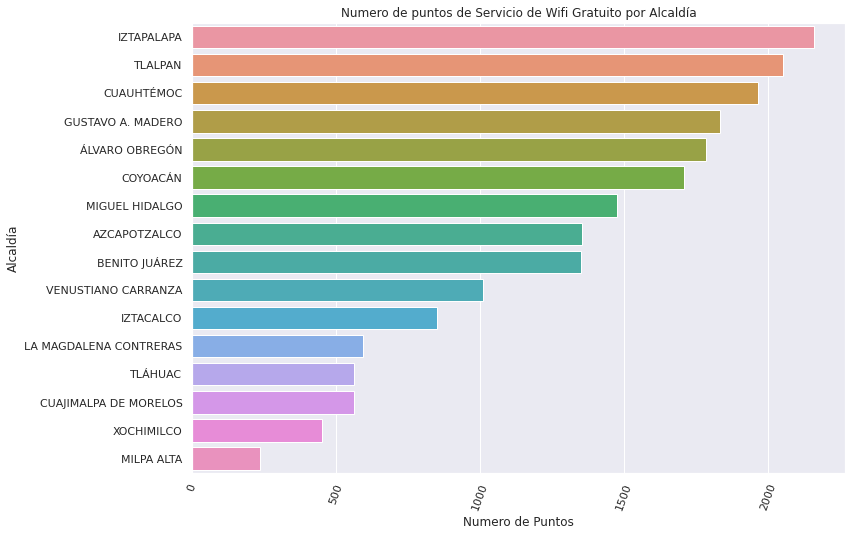

In [380]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = internet_cdmx, y = 'Alcaldía', order=internet_cdmx['Alcaldía'].value_counts().index)
plt.title('Numero de puntos de Servicio de Wifi Gratuito por Alcaldía')
plt.xticks(rotation =70)
plt.xlabel('Numero de Puntos')
plt.show()

Vemos que las alcaldías que mas tienen acceso a internet gratuito son iztapalapa, tlalpan y cuahutemoc. Por otro lado las que menos tienen sitios de Wifi gratuito son xochimilco y milpa alta. Y para ver que tantos puntos de servicio tienen de cada programa podemos hacer lo siguiente:

In [381]:
separados = internet_cdmx.groupby(['Alcaldía', 'Programa'])['ID'].count().unstack().fillna(0)

separados.head()

Programa,Mi_Barrio,PILARES,Postes_C5,Sitios_Publicos
Alcaldía,,,,
AZCAPOTZALCO,628,11,708,8
BENITO JUÁREZ,554,3,790,3
COYOACÁN,793,11,901,6
CUAJIMALPA DE MORELOS,323,5,234,1
CUAUHTÉMOC,480,14,1455,18


In [382]:
#Separando por alcaldia y programa
separados = internet_cdmx.groupby(['Alcaldía', 'Programa'])['ID'].count().unstack().fillna(0)
separados.columns = separados.columns.astype(str)
separados['Total'] = separados.sum(axis=1)
separados.sort_values('Total', inplace=True, ascending=True)

(array([   0.,  500., 1000., 1500., 2000., 2500.]),
 <a list of 6 Text major ticklabel objects>)

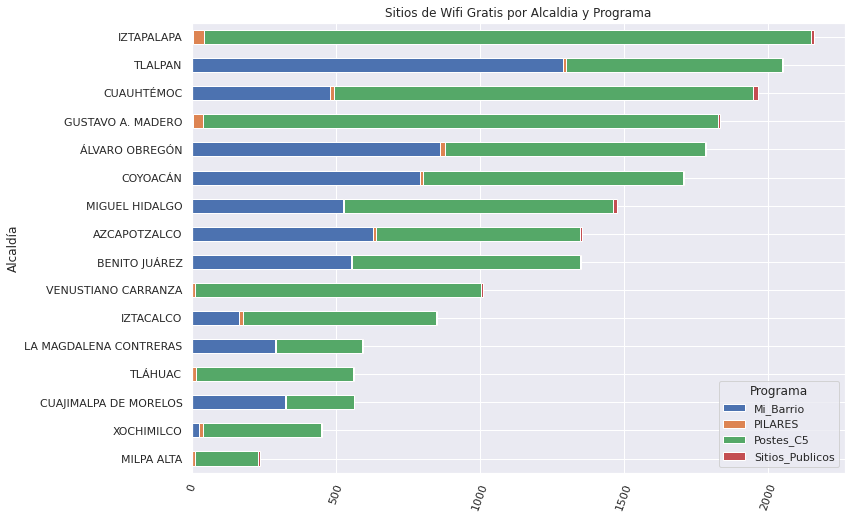

In [383]:
#Graficando
separados[['Mi_Barrio', "PILARES", "Postes_C5", "Sitios_Publicos"]].plot(kind='barh', stacked=True, figsize=((11.7,8.27)))
plt.title('Sitios de Wifi Gratis por Alcaldia y Programa')
plt.xticks(rotation=70, ha='center')

Vemos en la grafica que unas alcaldías tienen principalmente puntos de servicio  Wifi Gratuito con los postes C5 (tales como Iztapalapa y Venustiano Carranza) y otros con los del programa Mi-Barrio ( como Tlalpan y Alvaro Obregon).

Seguido de esto, analizando el numero de puntos de acceso para cada uno de los puntos de servicio proporcionados por cada programa, vemos que PILARES y Puntos de servicio en sitios públicos son los que ofrecen mas de un punto de acceso, como se puede ver en la siguiente gráfica. 

Text(0.5, 1.0, 'Distribución de la temperatura en las diferentes ciudades')

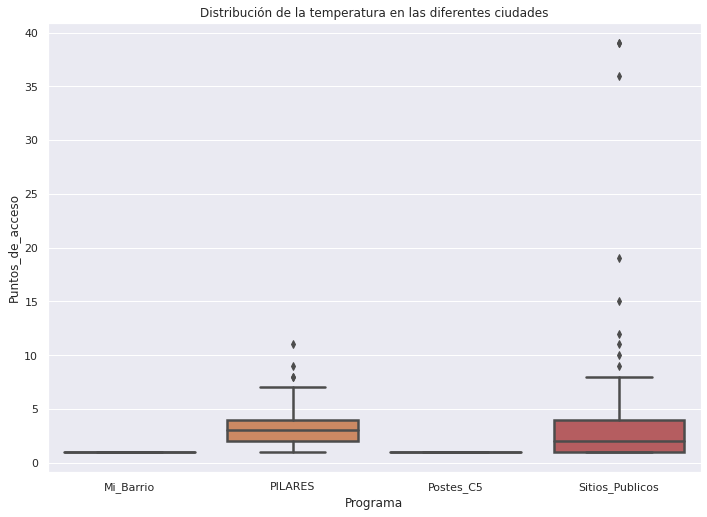

In [384]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.boxplot(x="Programa", y="Puntos_de_acceso", data=internet_cdmx, linewidth=2.5)
ax.set_title('Distribución de la temperatura en las diferentes ciudades')

In [385]:
c5_data.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,1,CENTRO,CUAUHTÉMOC,19.43528,-99.14715,1,Postes_C5
1,2,CENTRO,CUAUHTÉMOC,19.43510,-99.14582,1,Postes_C5
2,3,CENTRO,CUAUHTÉMOC,19.43457,-99.14386,1,Postes_C5
3,4,CENTRO,CUAUHTÉMOC,19.43437,-99.14270,1,Postes_C5
4,5,CENTRO,CUAUHTÉMOC,19.43424,-99.14188,1,Postes_C5


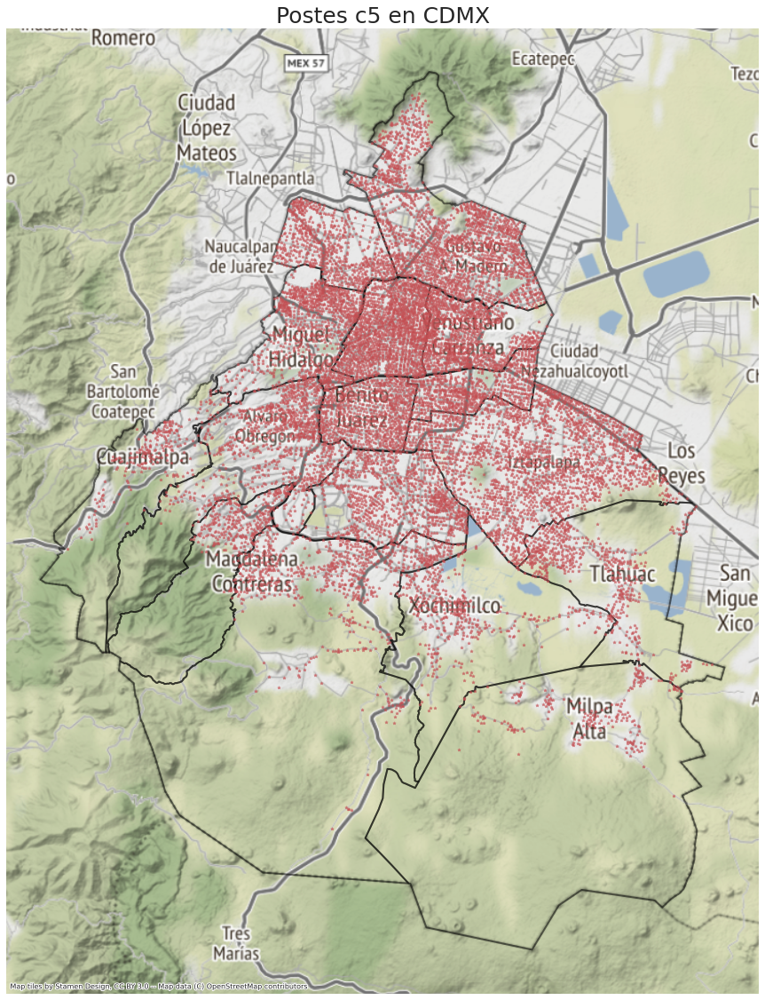

In [386]:
import geopandas
import matplotlib.pyplot as plt
import contextily as cx

gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (20,20),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Postes c5 en CDMX',
          fontsize = 25)
x, y = c5_data['Longitud'].values, c5_data['Latitud'].values
ax.scatter(x, y, marker="*", color='r', alpha=0.5, zorder=5, s=10)
cx.add_basemap(ax, crs=gdf.crs.to_string())

#### EDA del dataset de tiraderos clandestinos

In [387]:
tiradero_data.columns

Index(['id', 'column_1', 'fid', 'id_sedema', 'no_alcaldi', 'alcaldia', 'calle',
       'colonia', 'longitud', 'latitud', 'geo_point'],
      dtype='object')

Algo interesante que podemos observar, antes de entrar con gráficos, es que hay una columna llamadac *tipo_tirad*, segun el diccionario de datos, esta hace referencia al Identificador del tipo de tiradero clandestino. Sin embargo si nosotros analizamos los datos faltantes, vemos que nunca se reportó.

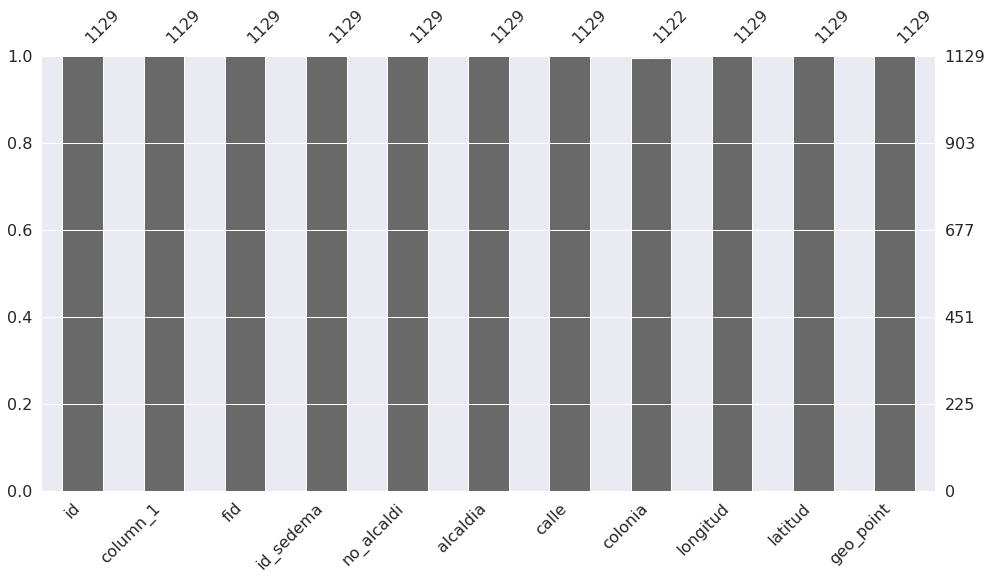

In [388]:
msno.bar(tiradero_data, figsize=(16,8))

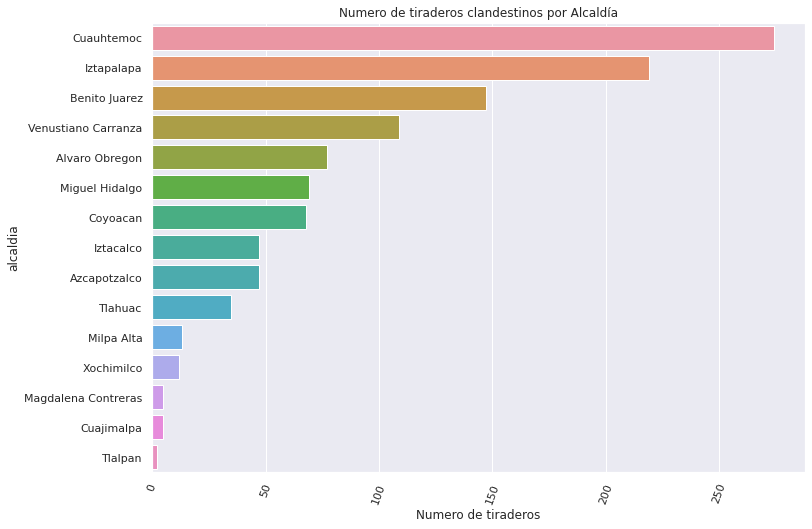

In [389]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = tiradero_data, y = 'alcaldia', order=tiradero_data['alcaldia'].value_counts().index)
plt.title('Numero de tiraderos clandestinos por Alcaldía')
plt.xticks(rotation =70)
plt.xlabel('Numero de tiraderos')
plt.show()

Haciendo uso de Pandas podemos filtrar para ver cuales son las colonias de la delegación Cuauhtemoc en las que mas tiraderos clandestinos hay. Esto se puede repetir para cada Delegación

Text(0.5, 1.0, 'Principales colonias con tiraderos clandestinos en delegación Cuauhtemoc')

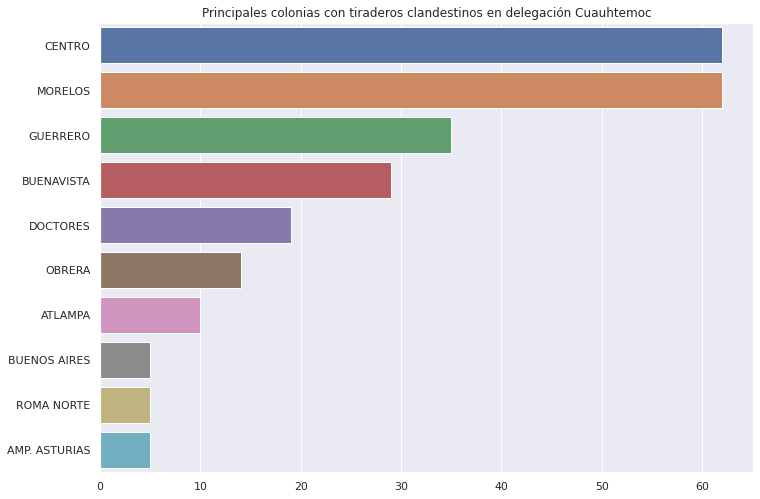

In [390]:
tiradero_filtrado = tiradero_data[tiradero_data['alcaldia'] == 'Cuauhtemoc']
top_10 = tiradero_filtrado['colonia'].value_counts(ascending=False)[:10]
sns.barplot(y = top_10.index, x = top_10.values)
plt.title('Principales colonias con tiraderos clandestinos en delegación Cuauhtemoc')


Posteriormente, observaremos en el mapa como se encuentran distribuidos estos tiraderos

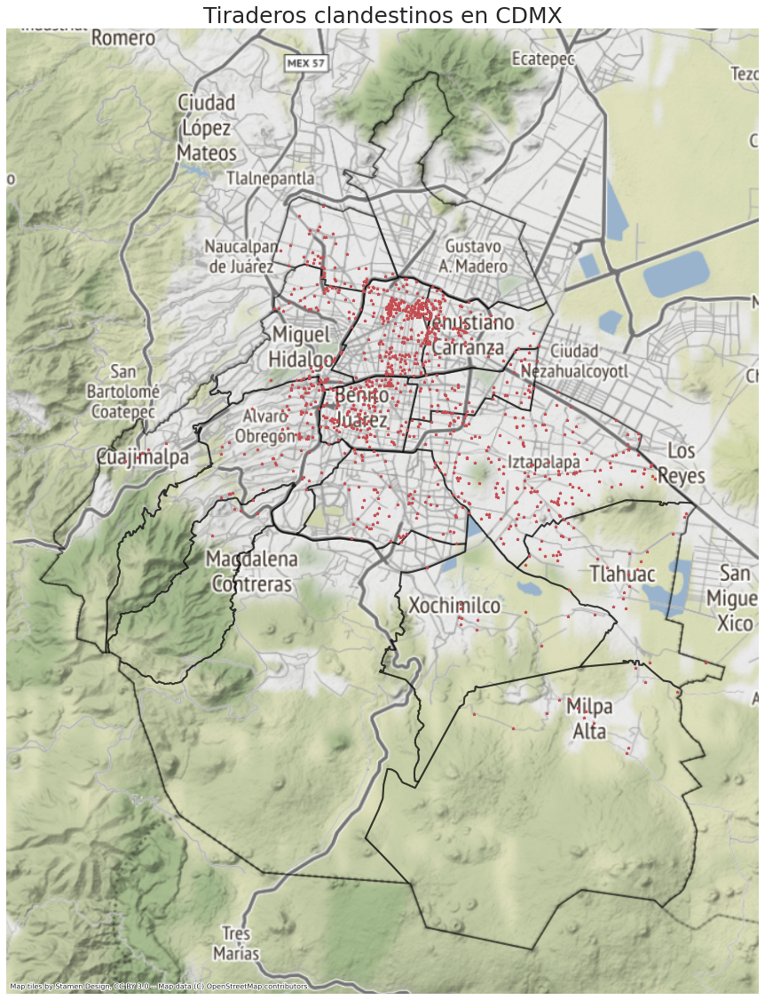

In [391]:
#graphs internet y tiraderos clandestinos
#TODO hacer lo de areas verdes
#TODO ver mapeo interactivo https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html
import geopandas
import matplotlib.pyplot as plt
import contextily as cx

gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (20,20),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Tiraderos clandestinos en CDMX',
          fontsize = 25)
x, y = tiradero_data['longitud'].values, tiradero_data['latitud'].values
ax.scatter(x, y, marker="*", color='r', alpha=1, zorder=5, s=10)
cx.add_basemap(ax, crs=gdf.crs.to_string())

Esto ya nos permite ver visualmente donde se concentran estos tiraderos clandestinos, lo cual confirma lo que vimos en los gráficos de barras, que principalmente se concentran en las delegaciones de Cuauhtemoc, Itzapalapa y Benito Juarez

#### EDA Dataset Areas Verdes

In [392]:
verde_data.head()

,id,geo_point_2d,geo_shape,muerdago,subcat_sed,subcve_sed,direccion,gid,cve_delg,delegacion,categoria,superficie,perimetro,cve_sedema,latitud,longitud
0,0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Panteones,604.0,Román Álvarez Moreno,268,2,Azcapotzalco,Equipamientos urbanos con vegetación,6660.027554,329.264738,600,19.487757,-99.206065
1,1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Deportivos,601.0,Avenida Canal deTezontle,87,8,Iztacalco,Equipamientos urbanos con vegetación,2917.257837,272.243614,600,19.388769,-99.116393
2,2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Camellones centrales y laterales,203.0,Canal Río Churubusco,180,8,Iztacalco,Áreas verdes complementarias o ligadas a la re...,1086.305646,425.043656,200,19.392887,-99.086991
3,3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,CORTEZA,89,8,Iztacalco,Equipamientos urbanos con vegetación,3605.704046,269.209436,600,19.383106,-99.107361
4,4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,El Lago,90,8,Iztacalco,Equipamientos urbanos con vegetación,19619.361577,798.409227,600,19.382213,-99.102842


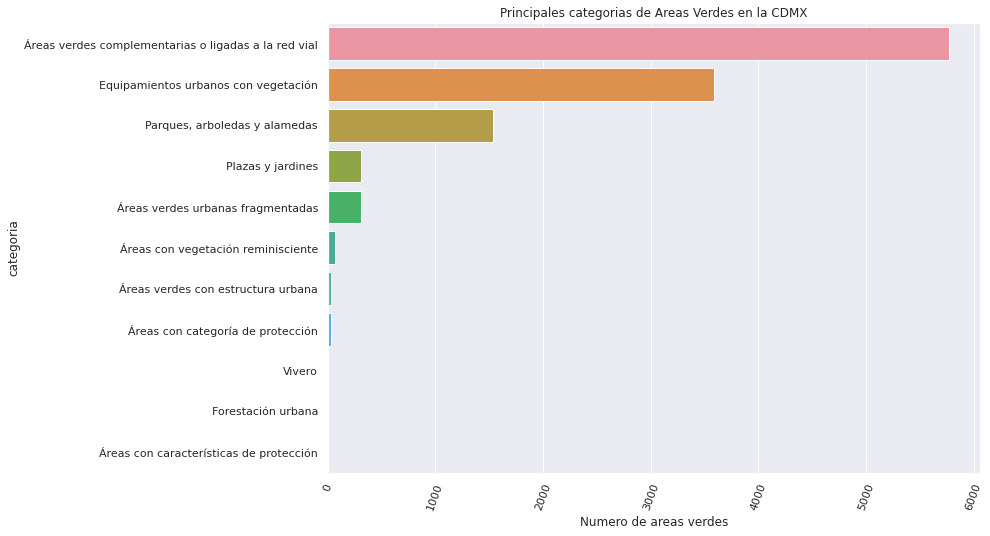

In [393]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = verde_data, y = 'categoria', order=verde_data['categoria'].value_counts().index)
plt.title('Principales categorias de Areas Verdes en la CDMX')
plt.xticks(rotation =70)
plt.xlabel('Numero de areas verdes')
plt.show()

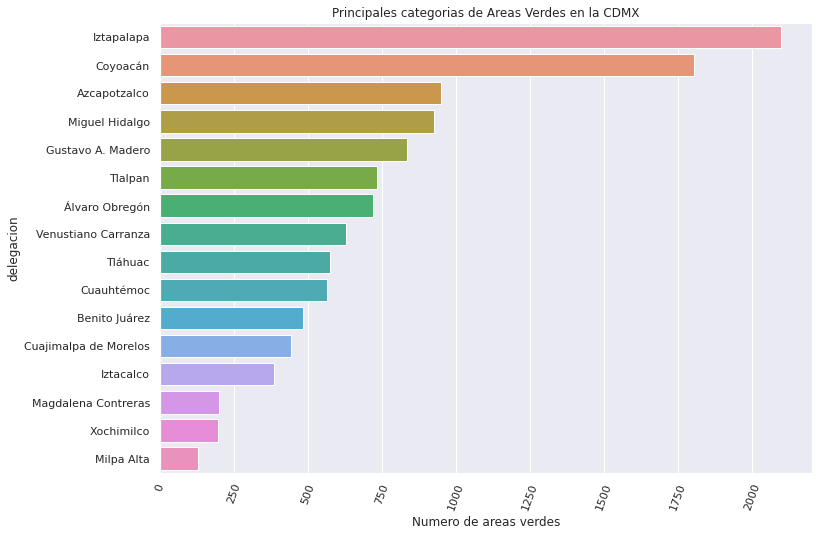

In [394]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = verde_data, y = 'delegacion', order=verde_data['delegacion'].value_counts().index)
plt.title('Principales categorias de Areas Verdes en la CDMX')
plt.xticks(rotation =70)
plt.xlabel('Numero de areas verdes')
plt.show()

Ahora veremos de manera gráfica donde se encuentran esas areas verdes

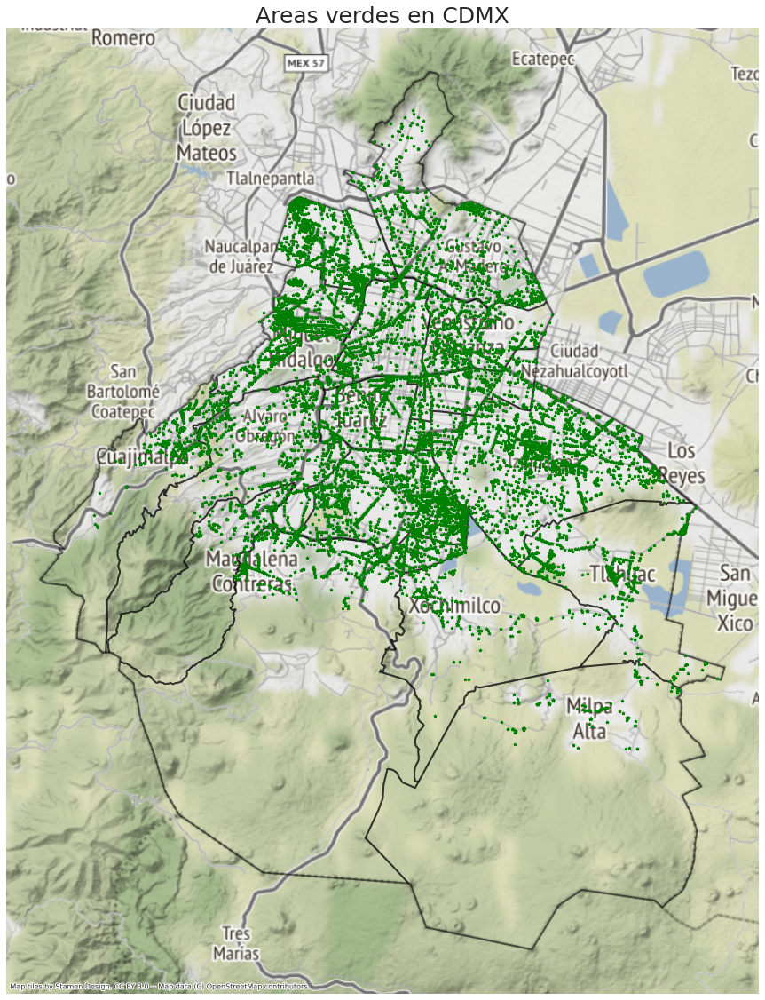

In [395]:
gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (20,20),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Areas verdes en CDMX',
          fontsize = 25)
x, y = verde_data['longitud'].values, verde_data['latitud'].values
ax.scatter(x, y, marker="*", color='green', alpha=1, zorder=5, s=10)
cx.add_basemap(ax, crs=gdf.crs.to_string())

#### EDA Conjuntos de datos generados

Para el primer conjunto, en el cual tenemos la suma de cada una de sus areas verdes, postes c5, tiraderos clandestinos, población y superficie para cada una de sus alcaldías, podemos ver la correlación entre sus variables.

In [396]:
df_completo.head(2)

,alcaldia,tiraderos,areas_verdes,puntos_wifi,poblacion,superficie
0,Cuauhtemoc,274.0,566,1967,545884,32.4
1,Iztapalapa,219.0,2098,2160,1835486,117.0


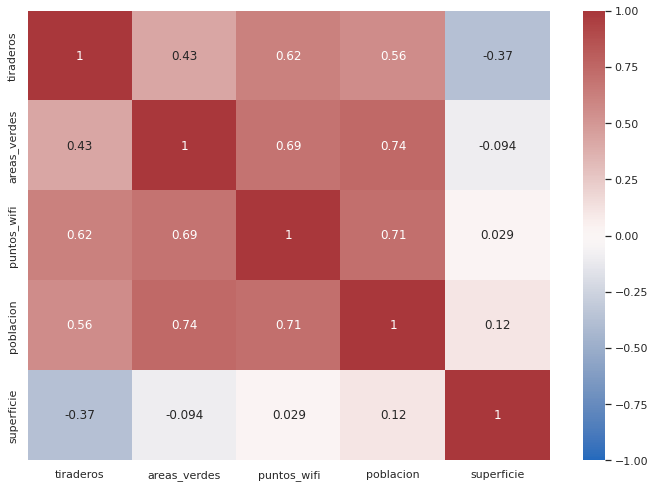

In [397]:
sns.heatmap(df_completo.corr(),
            vmin = -1,
            vmax = 1,
            cmap = 'vlag',
            annot = True)

Observamos que hay una ligera correlación negativa entre tiraderos y superficie, esto puede ser debido a que los tiraderos clandestinos como vimos en los EDA anteriores, se concentran en el centro de la CDMX, y algunas de las alcaldías mas grandes están en el exterior de la CDMX. 
Tambien vemos que hay una correlación positiva entre población y areas verdes, población y postes C5, esto es una buena señal ya que indica que donde hay mayor población hay mayor cantidad de postes C5.

Para el segundo conjunto ahora veremos en un mapa como están distribuidas las areas verdes, los postes c5 y los tiraderos clandestinos todo en un mismo mapa.

In [398]:
datos_visualizacion.tail()


,longitud,latitud,tipo
26513,-99.09956,19.44232,poste c5
26514,-99.09633,19.44754,poste c5
26515,-99.08593,19.41232,poste c5
26516,-99.08709,19.40945,poste c5
26517,-99.09224,19.40880,poste c5


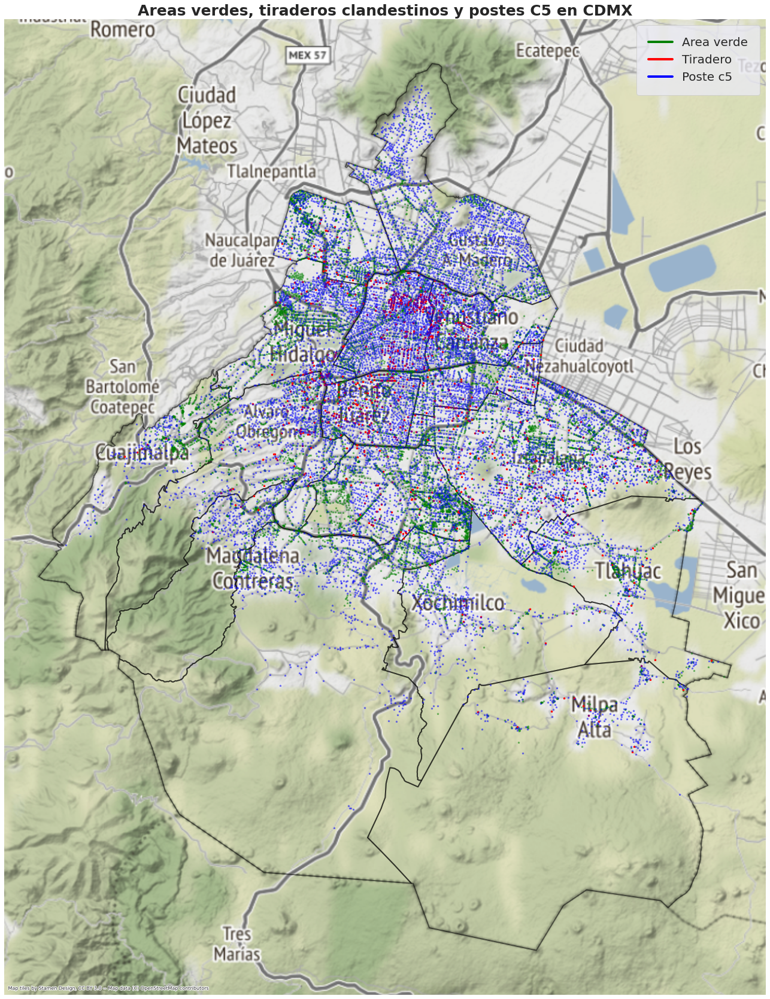

In [410]:
gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (30,30),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Areas verdes, tiraderos clandestinos y postes C5 en CDMX',
          fontsize = 25,
          fontweight='bold')


verde = datos_visualizacion[datos_visualizacion['tipo'] == 'area verde']
x, y = verde['longitud'].values, verde['latitud'].values
ax.scatter(x, y, marker="*", color= 'green', alpha=0.4, zorder=5, s=10)

rojo = datos_visualizacion[datos_visualizacion['tipo'] == 'tiradero']
x, y = rojo['longitud'].values, rojo['latitud'].values
ax.scatter(x, y, marker="*", color= 'red', alpha=1, zorder=5, s=10)

azul = datos_visualizacion[datos_visualizacion['tipo'] == 'poste c5']
x, y = azul['longitud'].values, azul['latitud'].values
ax.scatter(x, y, marker="*", color= 'blue', alpha=0.4, zorder=5, s=10)

from matplotlib.patches import Patch
legend_elements = [Line2D([0], [0], color='green', lw=4, label='Area verde'),
                   Line2D([0], [0], color='red', lw=4, label='Tiradero'),
                   Line2D([0], [0], color='blue', lw=4, label='Poste c5'),]

ax.legend(handles = legend_elements, prop={'size': 20}, borderpad=1)
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.savefig('figura_reporte_final.png')

### Visualizacion de la informacion utilizando un metodo de reducción de caracteristicas(PCA, t-SNE)

#### Análisis en Componentes Principales (PCA)

In [400]:
from __future__ import print_function
import time
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

In [401]:
#Llenamos los missing values para que no haya problemas con estandarizacion
df_completo = df_completo.fillna(0)

# Se divide el dataset en dos partes
X = df_completo.iloc[:,1:5].values
y = df_completo.iloc[:,0].values

#Estandarizamos
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X)



# Calculamos la matriz de covarianza
print('NumPy covariance matrix: \n%s' %np.cov(X_std.T))

#Calculamos los autovalores y autovectores de la matriz
cov_mat = np.cov(X_std.T)
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

#  Hacemos una lista de parejas (autovector, autovalor) 
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Ordenamos estas parejas den orden descendiente 
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visualizamos la lista de autovalores en orden desdenciente
print('Autovalores en orden descendiente:')
for i in eig_pairs:
    print(i[0])

NumPy covariance matrix: 
[[1.06666667 0.43010936 0.56161505 0.43861261]
 [0.43010936 1.06666667 0.73470873 0.79451924]
 [0.56161505 0.73470873 1.06666667 0.75896294]
 [0.43861261 0.79451924 0.75896294 1.06666667]]
Eigenvectors 
[[-0.4012683  -0.88497984  0.22798751  0.06177481]
 [-0.52244569  0.33662748  0.54075213 -0.56685058]
 [-0.53540446  0.01767298 -0.80278135 -0.26186224]
 [-0.52856061  0.32121688  0.10559799  0.77864784]]

Eigenvalues 
[2.95376647 0.73264571 0.31243704 0.26781745]
Autovalores en orden descendiente:
2.9537664676599102
0.7326457078339977
0.31243703826980324
0.26781745290295544


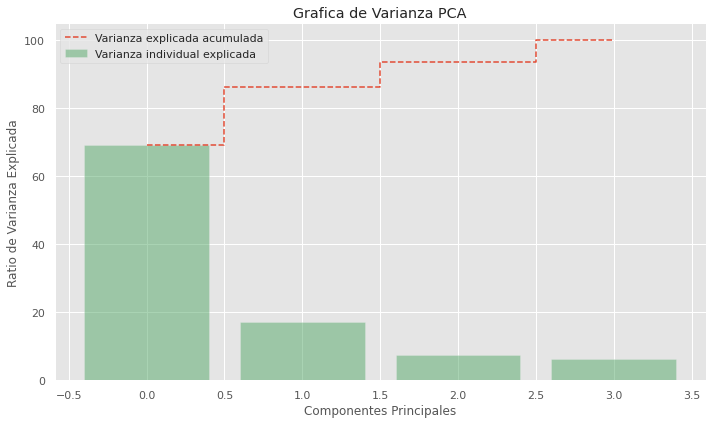

In [402]:
# A partir de los autovalores, calculamos la varianza explicada
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# Representamos en un diagrama de barras la varianza explicada por cada autovalor, y la acumulada
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 6))

    plt.bar(range(4), var_exp, alpha=0.5, align='center',
            label='Varianza individual explicada', color='g')
    plt.step(range(4), cum_var_exp, where='mid', linestyle='--', label='Varianza explicada acumulada')
    plt.ylabel('Ratio de Varianza Explicada')
    plt.xlabel('Componentes Principales')
    plt.title('Grafica de Varianza PCA')
    plt.legend(loc='best')
    plt.tight_layout()

Matriz W:
 [[-0.4012683  -0.88497984]
 [-0.52244569  0.33662748]
 [-0.53540446  0.01767298]
 [-0.52856061  0.32121688]]


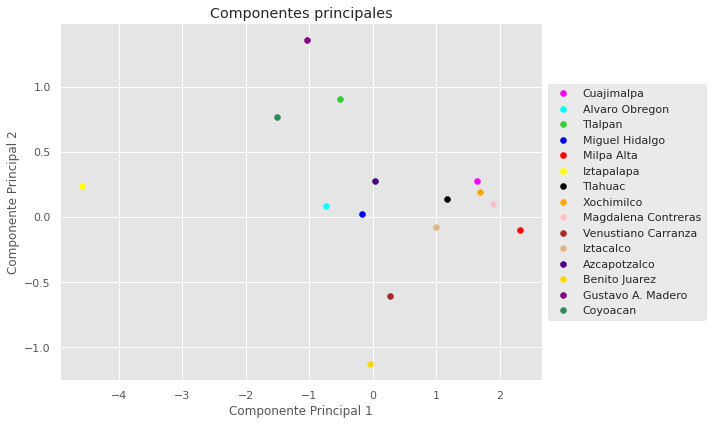

In [403]:
#Generamos la matríz a partir de los pares autovalor-autovector
matrix_w = np.hstack((eig_pairs[0][1].reshape(4,1),
                      eig_pairs[1][1].reshape(4,1)))

print('Matriz W:\n', matrix_w)

Y = X_std.dot(matrix_w)



with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 6))
    for lab, col in zip(set(y),
                        ('magenta', 'cyan', 'limegreen', 'blue', 'red', 'yellow', 'black', 'orange', 'pink', 'brown', 'burlywood', 'indigo', 'gold', 'cyan',
                         'seagreen')):
        plt.scatter(Y[y==lab, 0],
                    Y[y==lab, 1],
                    label=lab,
                    c=col)
    plt.xlabel('Componente Principal 1')
    plt.ylabel('Componente Principal 2')
    plt.title('Componentes principales')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show() 

#### t-Distributed Stochastic Neighbor Embedding (t-SNE)

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 15 nearest neighbors...
[t-SNE] Indexed 16 samples in 0.001s...
[t-SNE] Computed neighbors for 16 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 16 / 16
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.123573
[t-SNE] KL divergence after 300 iterations: 0.610627
t-SNE done! Time elapsed: 0.06666421890258789 seconds


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=500)
X_embedded = tsne.fit_transform(X)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 15 nearest neighbors...
[t-SNE] Indexed 16 samples in 0.000s...
[t-SNE] Computed neighbors for 16 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 16 / 16
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.523407
[t-SNE] KL divergence after 500 iterations: 0.353679
t-SNE done! Time elapsed: 0.10102391242980957 seconds


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


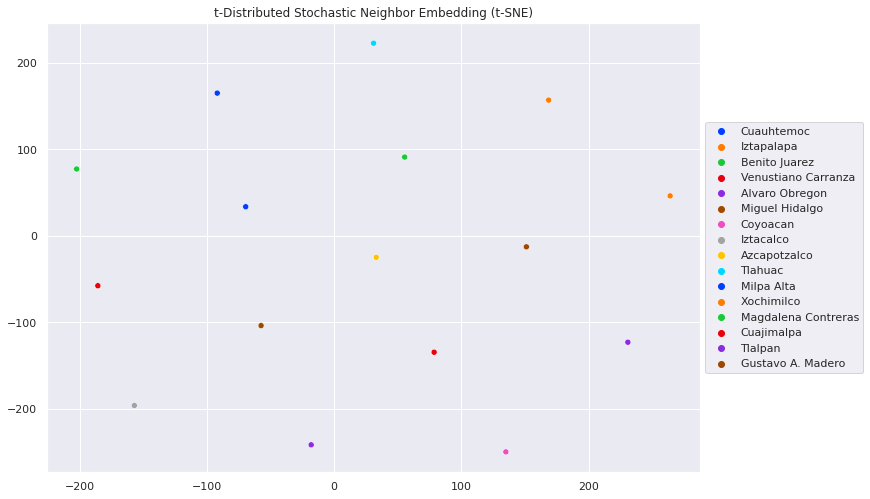

In [ ]:
palette = sns.color_palette("bright",16)
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title('t-Distributed Stochastic Neighbor Embedding (t-SNE)')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
